**1. Introduction:**

Description: Zillow provides a range of data sets, including home values, rental market trends, transactions, and more.
Data Offered: Zillow Home Value Index (ZHVI), transaction data, and more.
Access: Data is typically available for free download in CSV format.
Website: Zillow Researc

**3. Setup:**

In [9]:
# Import Libraries
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Setting visualisation styles
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = [10, 5]

# Define the path to your dataset
data_path = "../data/Metro_zhvi_uc_sfrcondo_tier_0.0_0.33_sm_sa_month.csv"

# Load Data
df = pd.read_csv(data_path)

# Display the first few rows of the dataframe
df.head()


,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2023-02-28,2023-03-31,2023-04-30,2023-05-31,2023-06-30,2023-07-31,2023-08-31,2023-09-30,2023-10-31,2023-11-30
0,102001,0,United States,country,NaN,56998.728368,57087.451898,57199.417038,57446.883983,57739.751582,...,172795.680048,173055.349146,173997.912517,175299.154884,176599.108161,177663.318089,178593.046315,179308.396321,179839.425099,180244.188442
1,394913,1,"New York, NY",msa,NY,123041.900445,123525.040805,123997.699691,124978.560698,126006.538332,...,403264.413427,404696.302219,407132.604433,410847.113392,414540.608521,417805.979375,420780.517716,423351.852070,425660.846237,427923.666905
2,753899,2,"Los Angeles, CA",msa,CA,127758.454901,128139.637175,128736.929273,129923.555314,131271.156077,...,608138.916524,600600.033281,598410.758330,600980.358390,606186.355260,613901.118719,623061.438162,632377.285543,640367.725728,646963.682171
3,394463,3,"Chicago, IL",msa,IL,77355.902453,77425.472507,77561.665482,77876.978780,78255.543319,...,180735.546871,181405.262425,182775.531578,184361.233262,186052.679388,187771.616213,189558.147837,191090.801436,192369.514952,193287.609474
4,394514,4,"Dallas, TX",msa,TX,66892.197718,66911.978029,66925.400862,66993.875510,67109.160860,...,250976.248425,249947.435301,249721.763202,250129.494160,250810.397757,251531.828039,252419.327848,252984.326217,253405.289615,253276.635473


**3. Preliminary Data Exploration:**

In [11]:
# Dataset Shape
print("Dataset Shape: ", df.shape)

# Data Types
print("Data Types:\n", df.dtypes)

# Missing Values
print("Missing Values:\n", df.isnull().sum())

# Summary Statistics for Numerical Columns
print("Summary Statistics:\n", df.describe())


Dataset Shape:  (892, 292)
Data Types:
 RegionID        int64
SizeRank        int64
RegionName     object
RegionType     object
StateName      object
               ...   
2023-07-31    float64
2023-08-31    float64
2023-09-30    float64
2023-10-31    float64
2023-11-30    float64
Length: 292, dtype: object
Missing Values:
 RegionID      0
SizeRank      0
RegionName    0
RegionType    0
StateName     1
             ..
2023-07-31    0
2023-08-31    0
2023-09-30    0
2023-10-31    0
2023-11-30    0
Length: 292, dtype: int64
Summary Statistics:
             RegionID    SizeRank     2000-01-31     2000-02-29     2000-03-31  \
count     892.000000  892.000000     427.000000     428.000000     429.000000   
mean   411755.058296  460.758969   57773.063036   57881.437653   57978.665718   
std     77664.453534  268.499019   30204.036749   30266.087508   30363.407491   
min    102001.000000    0.000000    7077.624325    7084.610885    7088.265117   
25%    394544.750000  229.750000   36259.81463

**4. Detailed Data Analysis:**



Distribution of Key Features:


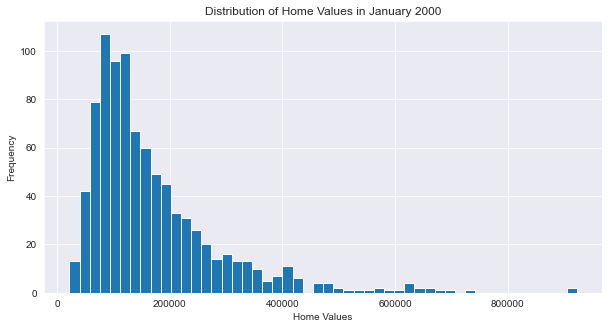

In [13]:
# Histogram of home values at a specific time
# Replace '2000-01-31' with the column name of interest
df['2023-01-31'].hist(bins=50)
plt.title('Distribution of Home Values in January 2000')
plt.xlabel('Home Values')
plt.ylabel('Frequency')
plt.show()




Time Series Analysis (if applicable):

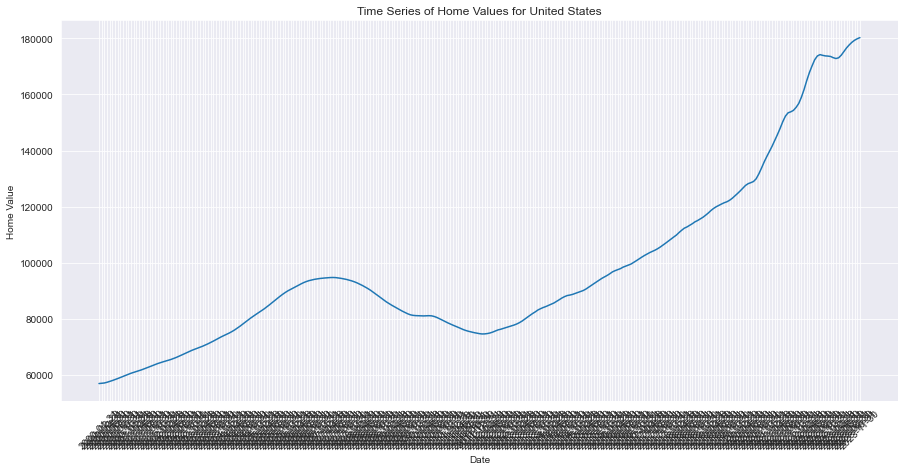

In [16]:
# Example: Plotting the time series for the first region
# Ensure to replace 'RegionName' with the actual region or index you're interested in

time_series = df.iloc[0, 5:]  # This selects all date columns for the first region
plt.figure(figsize=(15, 7))
plt.plot(time_series.index, time_series.values)
plt.title('Time Series of Home Values for ' + df['RegionName'][0])
plt.xticks(rotation=45)  # Rotates date labels for better readability
plt.xlabel('Date')
plt.ylabel('Home Value')
plt.show()



Correlation Analysis:
Understand how home values might correlate over time across different regions. This might be more complex given the structure of the data and might require reshaping the data for meaningful correlation analysis.

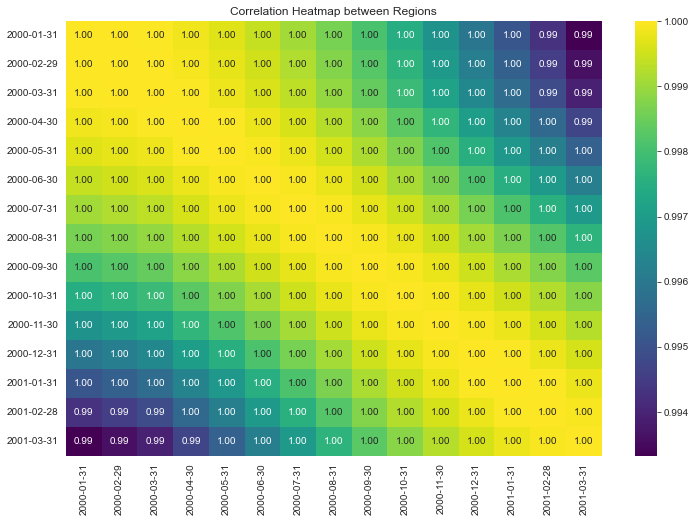

In [17]:
# Example: Correlation heatmap of home values across different regions at a specific time
# This is more of an illustrative example; you'll need to adapt it based on the specific analysis you want to perform.

# Selecting a subset of columns for simplicity
subset_data = df.iloc[:, 5:20]  # Adjust columns as per requirement
correlation_matrix = subset_data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="viridis")
plt.title('Correlation Heatmap between Regions')
plt.show()


**5. Data Cleaning (if needed):**
Based on the initial exploration, you may decide to clean the data, like handling missing values or anomalies. Since time series data is involved, you might need to consider filling strategies that respect the temporal nature of the data.

In [18]:
# Handling Missing Data (Example: Forward Filling)
df_clean = df.fillna(method='ffill')  # Forward fill
# or
#df_clean = df.interpolate()  # Interpolation

# Note: Choose a strategy that makes sense for your time series data


**Detailed Data Analysis for Los Angeles, CA:**

In [27]:
pip install plotly


Note: you may need to restart the kernel to use updated packages.


In [28]:
import plotly.express as px

# Transposing the DataFrame so that:
# - Each row represents a date
# - Each column represents a region's home values over time
df_transposed = df.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'StateName']).T

# Convert index to datetime and reset index for Plotly
df_transposed.index = pd.to_datetime(df_transposed.index)
df_long = df_transposed.reset_index().melt(id_vars='index', var_name='RegionName', value_name='HomeValue')

# Renaming the 'index' column to 'Date' for clarity
df_long.rename(columns={'index': 'Date'}, inplace=True)

# Create interactive line plot
fig = px.line(df_long, x='Date', y='HomeValue', color='RegionName', title='Home Value Time Series by Region')

# Improve layout
fig.update_layout(xaxis_title='Date', yaxis_title='Home Value', legend_title='Region')
fig.show()
